In [ ]:
!pip install -q -U google-generativeai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.9/163.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 718.3/718.3 kB 15.1 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import random
import pandas as pd
from PIL import Image
from tqdm import tqdm
import time  # Import time module for delay
import google.generativeai as genai

In [ ]:
# import getpass
# import os

# os.environ["GOOGLE_API_KEY"] = ""


# # Check if GOOGLE_API_KEY is not already set
# if "GOOGLE_API_KEY" not in os.environ:
#     # Prompt for the API key securely
#     os.environ["GOOGLE_API_KEY"] = getpass.getpass("Enter Google API Key: ")

In [ ]:
from google.colab import userdata
GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY_IND')
genai.configure(api_key=GOOGLE_API_KEY)

In [ ]:
for m in genai.list_models():
    print(m)

Model(name='models/chat-bison-001',
      base_model_id='',
      version='001',
      display_name='PaLM 2 Chat (Legacy)',
      description='A legacy text-only model optimized for chat conversations',
      input_token_limit=4096,
      output_token_limit=1024,
      supported_generation_methods=['generateMessage', 'countMessageTokens'],
      temperature=0.25,
      top_p=0.95,
      top_k=40)
Model(name='models/text-bison-001',
      base_model_id='',
      version='001',
      display_name='PaLM 2 (Legacy)',
      description='A legacy model that understands text and generates text as an output',
      input_token_limit=8196,
      output_token_limit=1024,
      supported_generation_methods=['generateText', 'countTextTokens', 'createTunedTextModel'],
      temperature=0.7,
      top_p=0.95,
      top_k=40)
Model(name='models/embedding-gecko-001',
      base_model_id='',
      version='001',
      display_name='Embedding Gecko',
      description='Obtain a distributed representatio

TypeError: Model.__init__() got an unexpected keyword argument 'max_temperature'

In [ ]:
import google.generativeai as genai
model = genai.GenerativeModel('gemini-1.0-pro-vision-latest')

In [ ]:
# Function to generate description for an image
def generate_description(image_path):
    try:
        img = Image.open(image_path)
        prompt = '''provide me all the information about texture and design of the image in descriptive format
        It should provide like this Texture Details: , Design Details: and overall description of image  '''
        response = model.generate_content([prompt, img], stream=False)
        response.resolve()
        description = response.text
        img.close()
        return description
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

In [ ]:
# Function to generate description for an image
def generate_description(image_path):
    try:
        img = Image.open(image_path)
        prompt = '''Based on the following details generate description for provided image
        Visuals: Detail key elements like shapes, lines, and textures, specifying the type (e.g., geometric, abstract).
        Colors: Describe primary and secondary colors, and any thematic palette (e.g., pastels).
        Style: Note artistic influences or styles (e.g., Art Deco, modern).
        Mood: Describe the emotional tone (e.g., soothing, energetic).
        Category: Classify the pattern.
        Uniqueness: Highlight distinctive features.
        provide the output in way that we can use that description to generate an image with image generation models It should be less than 100 tokens.
        ...'''
        response = model.generate_content([prompt, img], stream=False)
        response.resolve()
        description = response.text
        img.close()
        return description
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

In [ ]:
def generate_description1(image_path):
    try:
        img = Image.open(image_path)
        prompt = '''Create a vivid, concise description of the given image, focusing on the following elements:
Visual Elements: Elaborate on key components such as shapes, lines, and textures, identifying their type (e.g., geometric, organic, abstract).
Color Scheme: Specify the primary and secondary colors, and any overarching color theme (e.g., monochromatic, pastel, neon).
Style: Identify any noticeable artistic influences or styles (e.g., Art Nouveau, minimalist, futuristic, abstract).
Emotional Tone: Capture the mood or atmosphere evoked by the image (e.g., serene, dynamic, mysterious).
Classification: Categorize the image based on its dominant pattern or theme.
Distinctive Features: Emphasize any unique or standout features that set the image apart.
This description should be no more than three sentences, providing a rich, detailed portrayal of the image pattern. It will serve as the basis for generating an image that accurately reflects this description.
Example: The image is a geometric pattern composed of light and dark gray, white, and mauve pink shapes. The shapes are arranged in a random order, creating a sense of movement and energy. The pattern has a modern, abstract style and would be perfect for a variety of applications, such as wallpaper, fabric, or home decor.'''
        response = model.generate_content([prompt, img], stream=False)
        response.resolve()
        description = response.text
        img.close()
        return description
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

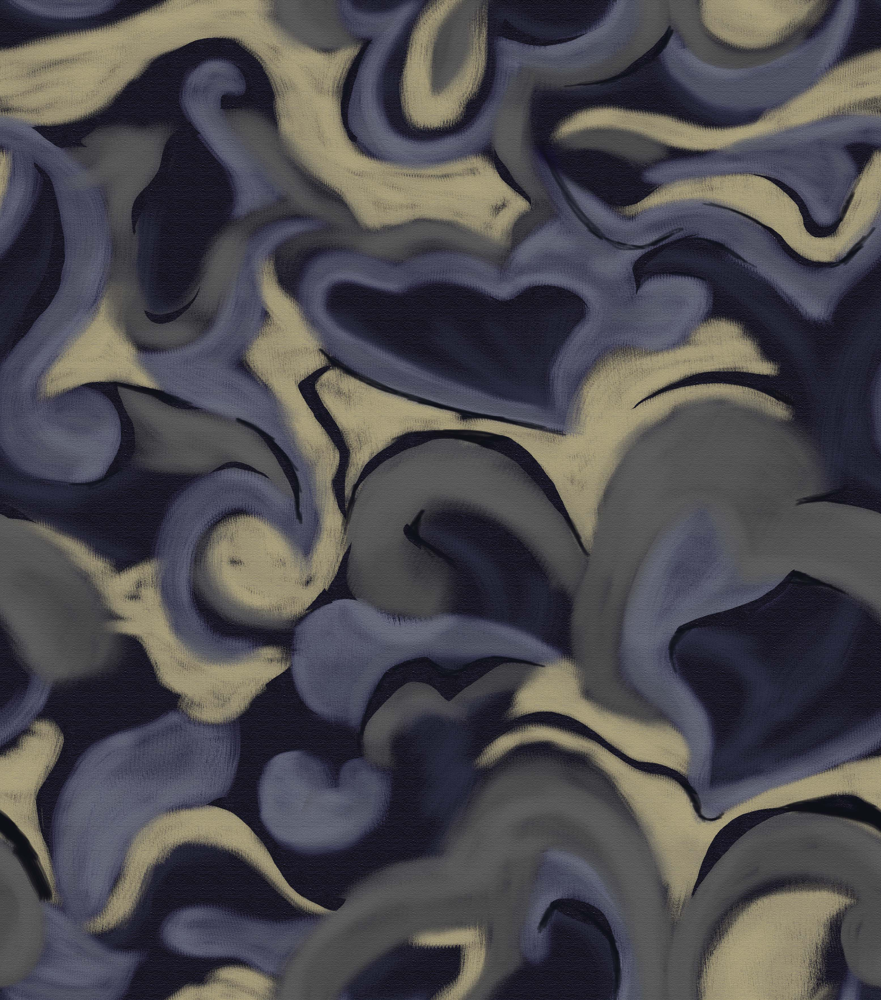

In [ ]:
# prompt: /content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/10301050.jpg
# write a code that can view the image  use pillow

from PIL import Image

image_path = "/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/10301050.jpg"

# Open the image using PIL
image = Image.open(image_path)

# Display the image
image


In [ ]:
image_path="/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/10301050.jpg"

des = generate_description1(image_path)

KeyboardInterrupt: 

In [ ]:
print(des)

None


In [ ]:
# Set the seed for reproducibility
seed = 42
random.seed(seed)

# Define the directory containing images
image_directory = "/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519"
all_images = [os.path.join(image_directory, img) for img in os.listdir(image_directory) if img.endswith(('.png', '.jpg', '.jpeg'))]

In [ ]:
# Randomly select 100 images
# selected_images = random.sample(all_images, 100)

# Create a DataFrame to store image names and descriptions
# df = pd.DataFrame(columns=["Image Name", "Description"])


len(all_images)

636

In [ ]:
# Output CSV file path
output_csv_path = "/content/drive/MyDrive/Datasets/600_des_gemini_image.csv"

# Function to load existing data if the CSV file exists
def load_existing_data():
    if os.path.exists(output_csv_path):
        return pd.read_csv(output_csv_path)
    else:
        return pd.DataFrame(columns=["Image Name", "Description"])

In [ ]:
# Load existing data
df = load_existing_data()

In [ ]:
# Get the list of already processed images
processed_images = set(dfbig["Image Name"])

NameError: name 'dfbig' is not defined

In [ ]:
len(processed_images)

NameError: name 'processed_images' is not defined

In [ ]:
# Filter out already processed images
images_to_process = [img for img in all_images if os.path.basename(img) not in processed_images]

NameError: name 'processed_images' is not defined

In [ ]:
len(images_to_process)

NameError: name 'images_to_process' is not defined

In [ ]:
images_to_process

NameError: name 'images_to_process' is not defined

In [ ]:
image_path = "/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/50310112-5.jpg"
generate_description(image_path)

Error processing image /content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/50310112-5.jpg: 400 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-1.0-pro-vision-latest:generateContent?%24alt=json%3Benum-encoding%3Dint: User location is not supported for the API use without a billing account linked.


In [ ]:
# # Resume processing the remaining images
# for idx, image_path in enumerate(tqdm(images_to_process, desc="Processing Images")):
#     description = generate_description(image_path)
#     if description:
#         df = df.append({"Image Name": os.path.basename(image_path), "Description": description}, ignore_index=True)

#     # Save progress every 10 images
#     if idx % 10 == 0:
#         df.to_csv(output_csv_path, index=False)

#     time.sleep(5)  # Add a 5-second delay between requests

# # Save the final DataFrame to the CSV file
# df.to_csv(output_csv_path, index=False)
# print(f"Descriptions saved to {output_csv_path}")

In [ ]:
# Create a DataFrame to store image names and descriptions
data = []

# Iterate over the selected images and generate descriptions
for image_path in tqdm(images_to_process, desc="Processing Images"):
    description = generate_description(image_path)
    if description:
        data.append({"Image Name": os.path.basename(image_path), "Description": description})
    time.sleep(2)  # Add a 2-second delay between requests

NameError: name 'images_to_process' is not defined

In [ ]:
len(data)

0

In [ ]:
# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
output_csv_path = "/content/drive/MyDrive/Datasets/2_600_des_gemini_image.csv"
df.to_csv(output_csv_path, index=False)
print(f"Descriptions saved to {output_csv_path}")

Descriptions saved to /content/drive/MyDrive/Datasets/2_600_des_gemini_image.csv


In [ ]:
# Optional: Print a sample of the DataFrame
df.head()

""


In [ ]:
df.shape

(0, 0)

In [ ]:
df1 = pd.read_csv("/content/drive/MyDrive/Datasets/2_600_des_gemini_image.csv")
df = pd.read_csv("/content/drive/MyDrive/Datasets/600_des_gemini_image.csv")

EmptyDataError: No columns to parse from file

In [ ]:
df.shape

(408, 2)

In [ ]:
df1.shape

(227, 2)

In [ ]:
dfbig = pd.concat([df, df1], ignore_index=True)

In [ ]:
dfbig.shape

(635, 2)

In [ ]:
output_csv_path = "/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/des_gemini_image.csv"
dfbig.to_csv(output_csv_path, index=False)

In [ ]:
dfbig

,Image Name,Description
0,5031176-3.jpg,The image is an abstract painting. It has a l...
1,4031058.jpg,An abstract painting with a painterly style. ...
2,10301044.jpg,The image is a seamless floral pattern with a...
3,5031206-4.jpg,The image is a seamless pattern of overlappin...
4,5031017 -4.jpg,The image is a seamless pattern of white line...
...,...,...
630,5031285-3.jpg,Abstract pastel brush strokes with painterly ...
631,5031212-3.jpg,The image is a geometric abstract painting. I...
632,5031138-5.jpg,Abstract painting. Black and white. Vertical ...
633,5030930-4.jpg,The image is an abstract painting with a marb...


In [ ]:
import pandas as pd
import json

# Load your CSV file
df = pd.read_csv(r"/content/drive/MyDrive/abstract_2024-05-09_0519/des_gemini_image.csv")  # Update this with the actual path to your CSV

# Define the path for the output JSONL file
jsonl_file_path = r'/content/drive/MyDrive/abstract_2024-05-09_0519/metadata.jsonl'  # Update this with the desired output path

# Open a file to write
with open(jsonl_file_path, 'w', encoding='utf-8') as outfile:
    for _, row in df.iterrows():
        # Construct a dictionary to be dumped as JSON
        json_dict = {"image": row['Image Name'], "text": row['Description']}

        # Convert the dictionary to a JSON string and write to the file with a newline
        outfile.write(json.dumps(json_dict) + '\n')

print(f"JSONL file has been created and saved to {jsonl_file_path}")

JSONL file has been created and saved to /content/drive/MyDrive/abstract_2024-05-09_0519/metadata.jsonl


In [ ]:
df['Description'][407]

' The image is a geometric pattern composed of light and dark gray, white, and mauve pink shapes. The shapes are arranged in a random order, creating a sense of movement and energy. The pattern has a modern, abstract style and would be perfect for a variety of applications, such as wallpaper, fabric, or home decor.'

In [ ]:
import os
import random
import pandas as pd
from PIL import Image
from tqdm import tqdm
import time
import google.generativeai as genai
from google.colab import userdata

GOOGLE_API_KEY = userdata.get('GOOGLE_API_KEY')
genai.configure(api_key=GOOGLE_API_KEY)

model = genai.GenerativeModel('gemini-1.0-pro-vision-latest')

# Function to generate description for an image
def generate_description(image_path):
    try:
        img = Image.open(image_path)
        prompt = '''Based on the following details generate description for provided image
        Visuals: Detail key elements like shapes, lines, and textures, specifying the type (e.g., geometric, abstract).
        Colors: Describe primary and secondary colors, and any thematic palette (e.g., pastels).
        Style: Note artistic influences or styles (e.g., Art Deco, modern).
        Mood: Describe the emotional tone (e.g., soothing, energetic).
        Category: Classify the pattern.
        Uniqueness: Highlight distinctive features.
        provide the output in way that we can use that description to generate an image with image generation models It should be less than 100 tokens.
        ...'''
        response = model.generate_content([prompt, img], stream=False)
        response.resolve()
        description = response.text
        img.close()
        return description
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

# Set the seed for reproducibility
seed = 42
random.seed(seed)

# Define the directory containing images
image_directory = "/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519"
all_images = [os.path.join(image_directory, img) for img in os.listdir(image_directory) if img.endswith(('.png', '.jpg', '.jpeg'))]

# Output CSV file path
output_csv_path = "/content/drive/MyDrive/Datasets/600_des_gemini_image.csv"

# Function to load existing data if the CSV file exists
def load_existing_data():
    if os.path.exists(output_csv_path):
        return pd.read_csv(output_csv_path)
    else:
        return pd.DataFrame(columns=["Image Name", "Description"])

# Load existing data
df = load_existing_data()

# Get the list of already processed images
processed_images = set(df["Image Name"])

# Filter out already processed images
images_to_process = [img for img in all_images if os.path.basename(img) not in processed_images]

# Iterate over the selected images and generate descriptions
for idx, image_path in enumerate(tqdm(images_to_process, desc="Processing Images")):
    description = generate_description(image_path)
    if description:
        df = df.append({"Image Name": os.path.basename(image_path), "Description": description}, ignore_index=True)

    # Save progress every 10 images
    if idx % 10 == 0:
        df.to_csv(output_csv_path, index=False)

    time.sleep(5)  # Add a 5-second delay between requests

# Save the final DataFrame to the CSV file
df.to_csv(output_csv_path, index=False)
print(f"Descriptions saved to {output_csv_path}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/abstract_2024-05-09_0519'

# Gemini Flash model

In [ ]:
import google.generativeai as genai
model = genai.GenerativeModel('gemini-1.5-flash-latest')

In [ ]:
# Function to generate description for an image
def generate_description(image_path):
    try:
        img = Image.open(image_path)
        prompt = '''Based on the following details generate description for provided image
        Visuals: Detail key elements like shapes, lines, and textures, specifying the type (e.g., geometric, abstract).
        Colors: Describe primary and secondary colors, and any thematic palette (e.g., pastels).
        Style: Note artistic influences or styles (e.g., Art Deco, modern).
        Mood: Describe the emotional tone (e.g., soothing, energetic).
        Category: Classify the pattern.
        Uniqueness: Highlight distinctive features.
        provide the output in way that we can use that description to generate an image with image generation models It should be less than 100 tokens.
        ...'''
        response = model.generate_content([prompt, img], stream=False)
        response.resolve()
        description = response.text
        img.close()
        return description
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

In [ ]:
# Set the seed for reproducibility
seed = 42
random.seed(seed)

# Define the directory containing images
image_directory = "/content/drive/MyDrive/Datasets/abstract_2024-05-09_0519"
all_images = [os.path.join(image_directory, img) for img in os.listdir(image_directory) if img.endswith(('.png', '.jpg', '.jpeg'))]

In [ ]:
selected_images = random.sample(all_images, 100)

In [ ]:
# Create a DataFrame to store image names and descriptions
data = []

# Iterate over the selected images and generate descriptions
for image_path in tqdm(selected_images, desc="Processing Images"):
    description = generate_description(image_path)
    if description:
        data.append({"Image Name": os.path.basename(image_path), "Description": description})
    time.sleep(2)  # Add a 2-second delay between requests

Processing Images:   0%|          | 0/100 [00:00<?, ?it/s]WARNING:tornado.access:400 POST /v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 1886.24ms


Error processing image /content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/5030930-5.jpg: 400 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint: User location is not supported for the API use without a billing account linked.


Processing Images:   1%|          | 1/100 [00:04<07:04,  4.29s/it]WARNING:tornado.access:400 POST /v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 2634.58ms


Error processing image /content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/50310112-4.jpg: 400 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint: User location is not supported for the API use without a billing account linked.


Processing Images:   2%|▏         | 2/100 [00:09<08:07,  4.97s/it]WARNING:tornado.access:400 POST /v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 2567.13ms


Error processing image /content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/4031065.jpg: 400 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint: User location is not supported for the API use without a billing account linked.


Processing Images:   3%|▎         | 3/100 [00:14<08:07,  5.03s/it]WARNING:tornado.access:400 POST /v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint (127.0.0.1) 3738.46ms


Error processing image /content/drive/MyDrive/Datasets/abstract_2024-05-09_0519/10301077-2.jpg: 400 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-1.5-flash-latest:generateContent?%24alt=json%3Benum-encoding%3Dint: User location is not supported for the API use without a billing account linked.


Processing Images:   4%|▍         | 4/100 [00:22<09:08,  5.72s/it]


KeyboardInterrupt: 

In [ ]:
data

[]

In [ ]:
# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
output_csv_path = "/content/drive/MyDrive/Datasets/gemini-flash_image_descriptions.csv"
df.to_csv(output_csv_path, index=False)
print(f"Descriptions saved to {output_csv_path}")

In [ ]:
# Optional: Print a sample of the DataFrame
df.head()